# clustering

> Fill in a module description here

In [ ]:
#| hide

%load_ext autoreload
%autoreload 2

from nbdev.showdoc import *

no env var SINGLELINE_DATA_HOME, defaulting to: None
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
import math

import pandas as pd
from fastai.vision.all import *

from singleline_stroke3.embeddings import *
from singleline_stroke3.fileorg import *

In [ ]:
EXTERNAL_PARENT_DIR = Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks')
EXTERNAL_SKETCHBOOKS_DIR = EXTERNAL_PARENT_DIR / 'sketchbooks'
EXTERNAL_DATA_HOME = EXTERNAL_PARENT_DIR / 'singleline_data'

In [ ]:
PREV_EPOCH = SketchbookEpoch(epoch='20231214', data_home=EXTERNAL_DATA_HOME)
EPOCH = SketchbookEpoch(epoch='20240104', data_home=EXTERNAL_DATA_HOME)

PREV_01_FLAT = PREV_EPOCH.dir_01_FLAT()
PREV_02_CATEGORIZED = PREV_EPOCH.dir_02_CATEGORIZED()
PREV_03_HAND = PREV_EPOCH.dir_03_HANDLABELED()

CURR_01_FLAT = EPOCH.dir_01_FLAT()
CURR_02_CATEGORIZED = EPOCH.dir_02_CATEGORIZED()
CURR_03_HAND = EPOCH.dir_03_HANDLABELED()
CURR_04_CROP = EPOCH.dir_04_CROP()

no env var SINGLELINE_DATA_HOME, defaulting to: None
no env var SINGLELINE_DATA_HOME, defaulting to: None
no env var SINGLELINE_DATA_HOME, defaulting to: None


In [ ]:
EXTERNAL_SKETCHBOOKS_DIR.ls()

(#33) [Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb67'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb69'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb05'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb68'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb50'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb35'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb32'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb04'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/.DS_Store'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb26')...]

In [ ]:
flatten_sketchbooks(EXTERNAL_SKETCHBOOKS_DIR, CURR_01_FLAT)

no env var SINGLELINE_DATA_HOME, defaulting to: None
creating /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/01_FLAT/art
copying /Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb67/art/016.jpg to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/01_FLAT/art/sb67p016.jpg
copying /Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb67/art/002.jpg to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/01_FLAT/art/sb67p002.jpg
copying /Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb67/art/003.jpg to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/01_FLAT/art/sb67p003.jpg
copying /Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb67/art/017.jpg to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/01_FLAT/art/sb67p017.jpg
copying /Users/al/Dropbox/2-Areas/2-Sketchbooks/sketchbooks/sb67/art/047-color.jpg to /Users/al/Dropbox/2-Areas/2-Sk

({'art': 2726, 'notes': 268, 'cover': 38},
 {'sb67': 127,
  'sb69': 145,
  'sb05': 124,
  'sb68': 131,
  'sb50': 114,
  'sb35': 111,
  'sb32': 116,
  'sb04': 3,
  'sb26': 83,
  'sb28': 117,
  'sb44': 122,
  'sb72': 81,
  'sb11': 108,
  'sb73': 94,
  'sb45': 123,
  'sb42': 118,
  'sb06': 107,
  'sb01': 72,
  'sb55': 117,
  'sb31': 106,
  'sb00': 81,
  'sb38': 120,
  'sb07': 112,
  'sb78': 72,
  'sb25': 165,
  'sb48': 119,
  'sb77': 124,
  'sb46': 120})

In [ ]:
CURR_01_FLAT

Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/01_FLAT')

## Predict embeddings on new dataset

In [ ]:
# dir_to_embed = DATA_HOME / "raster/epoch-20231214/01_FLAT"
dir_to_embed = CURR_01_FLAT

path = Path(dir_to_embed)
files = get_image_files(path)
len(files)

batched_fnames, ordered_dls = batch_fnames_and_images(dir_to_embed)

total items: 3032, num batches: 48


In [ ]:
learn = load_resnet(
    data_home=EXTERNAL_DATA_HOME,
    model_path=PRETRAINED_MODEL_PATH,
    model_checkpoint=PRETRAINED_CHECKPOINT,
)

learn.model[-1]

Sequential(
  (0): AdaptiveConcatPool2d(
    (ap): AdaptiveAvgPool2d(output_size=1)
    (mp): AdaptiveMaxPool2d(output_size=1)
  )
  (1): fastai.layers.Flatten(full=False)
  (2): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): Dropout(p=0.25, inplace=False)
  (4): Linear(in_features=1024, out_features=512, bias=False)
  (5): ReLU(inplace=True)
  (6): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): Dropout(p=0.5, inplace=False)
  (8): Linear(in_features=512, out_features=5, bias=False)
)

In [ ]:
rows = []
for x in embed_dir(dir_to_embed, learn, strip_dir=DATA_HOME):
    rows.append(x)
df = pd.DataFrame(rows)
print(f"num rows: {len(df)}")
df.head()

total items: 3032, num batches: 48
num rows: 3032


,idx,indiv_fname,orig_fname,label,emb_csv
0,0,sb73p010-color.jpg,art/sb73p010-color.jpg,art,"2.687597,0.9639229,-0.73929733,-0.6553513,0.021999717,-0.65341413,1.1576934,-0.4896673,-0.7537334,-0.0741663,0.8530488,-0.72562873,0.81325257,-0.6266761,-0.68991846,-0.57515705,-0.08888841,-0.010155916,0.58745134,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,3.1254654,-0.4518578,0.24979973,-0.73986673,-0.45211998,-0.014540076,-0.67007643,0.3398419,-0.4592305,-0.600525,-0.6186755,-0.73933,0.05950862,0.6393813,-0.6179389,-0.61049384,1.1035624,0.9551785,0.9943095,-0.75794554,-0.59257406,0.4626351,0.7175241,0.078965604,0.6600997,-0.25103182,-0.66552746,0.6112485,0.901239..."
1,1,sb77prear-cover.jpg,cover/sb77prear-cover.jpg,cover,"1.9835572,0.88216716,-0.73929733,-0.6553513,0.95597816,-0.65341413,-0.6597224,1.1695832,-0.7537334,0.30802843,-0.62038505,-0.72562873,-0.662768,-0.01779759,-0.68991846,-0.57515705,-0.07535747,-0.6520286,1.559851,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,1.3563297,-0.6690378,-0.17245707,-0.4265231,-0.73986673,-0.45211998,-0.5716219,-0.67007643,1.3844777,-0.01508677,-0.600525,-0.18866462,-0.73933,-0.28364885,-0.65925777,0.6516924,-0.61049384,1.7278569,0.21176928,-0.37875053,-0.75794554,0.16353595,1.3892753,-0.6001429,-0.6438874,2.9371314,0.9321619,-0.66552746,-0.6482407,0.6786..."
2,2,sb55p003.jpg,art/sb55p003.jpg,art,"1.622292,-0.2968188,-0.73929733,0.6021224,1.4958,-0.21535778,-0.7267234,-0.4896673,-0.7537334,-0.10785735,1.0314178,-0.72562873,-0.662768,-0.6266761,-0.68991846,1.5773908,-0.5467274,-0.63079214,-0.6898426,-0.6497359,-0.64108604,-0.55193967,0.290758,-0.6779002,-0.57759243,0.6712836,-0.4518578,0.73998094,1.4330137,0.009113848,-0.68509877,-0.67007643,1.9814153,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.33041948,0.57097626,1.1697849,-0.61049384,0.01691258,0.56803906,-0.27057087,-0.75794554,-0.59257406,0.42289907,1.921669,-0.651804,-0.26263413,-0.42323184,-0.66552746,0.81260383,0.13302967,-0.7..."
3,3,sb73p061.jpg,art/sb73p061.jpg,art,"0.16305512,1.4613445,-0.73929733,-0.6553513,0.8147204,-0.65341413,-0.17605859,0.19489205,-0.7537334,1.671761,1.0696301,-0.72562873,-0.662768,-0.6266761,-0.68991846,0.94930255,1.1227012,-0.6520286,-0.6898426,-0.6497359,-0.64108604,-0.55193967,0.07409674,-0.6779002,-0.57759243,-0.6690378,-0.07547301,0.60642123,-0.57024753,0.70669293,-0.68509877,-0.67007643,4.085253,0.099163026,-0.31986937,-0.6186755,1.3904073,1.0975487,1.2184626,0.08304453,-0.60790604,0.49650353,-0.24247655,-0.6682474,-0.75794554,1.084398,-0.6157326,-0.6001429,-0.651804,0.34641546,-0.59497476,-0.66552746,-0.6482407,1.158359,..."
4,4,sb73p041.jpg,art/sb73p041.jpg,art,"1.9151492,0.6609892,-0.73929733,-0.6553513,1.1880168,-0.65341413,-0.7267234,-0.14307764,-0.7537334,-0.34104526,0.3361588,-0.72562873,-0.35769063,-0.42719716,-0.4528957,-0.26852533,0.41437465,-0.6520286,-0.40210772,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,0.020544767,-0.6346607,-0.4518578,-0.26067856,0.2364592,-0.34402665,-0.68509877,-0.67007643,1.3040129,-0.39724284,-0.600525,-0.6186755,-0.73933,0.4320628,-0.19739038,-0.42163545,-0.61049384,0.97026175,-0.5976355,-0.6682474,-0.75794554,0.3709892,1.178539,-0.6001429,-0.651804,-0.269921,-0.49530712,-0.66552746,-0.5894381,1.357..."


### saving/loading embeddings

In [ ]:
embeddings_fname = f"{str(dir_to_embed)}.tsv"
df.to_csv(embeddings_fname, index=False, sep="\t", header=True)
print(f"wrote {embeddings_fname}")

df = pd.read_csv(embeddings_fname, delimiter="\t", index_col="idx")
df.head()

embs = pd_series_to_embs(df.emb_csv)
print(embs.shape)

wrote /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/01_FLAT.tsv
(3032, 512)


## KMeans centroids

In [ ]:
#kmeans = train_kmeans(embs, ncentroids=16)

centroids, cluster_to_label = load_centroids(
    data_home=singleline_data_home('../data_home'),
    model_path=PRETRAINED_MODEL_PATH
)
assigner = cluster_assigner(centroids, cluster_to_label)

no env var SINGLELINE_DATA_HOME, defaulting to: None
reading ../data_home/models/epoch-20231128/01_FLAT_cluster_centroids.json
reading ../data_home/models/epoch-20231128/01_FLAT_cluster_labels.json


In [ ]:
# assign nearest centroid to each
embs = pd_series_to_embs(df.emb_csv)
knn_dist, knn_clusterid, knn_label = assigner(embs)
knn_label[:5], knn_clusterid[:5]

(['1_watercolors', '1_watercolors', '0_drawings', '2_notes', '0_drawings'],
 array([[ 5],
        [ 5],
        [15],
        [12],
        [13]]))

In [ ]:
categorized_fname = EPOCH.tsv_02_CATEGORIZED()
categorized_dir = EPOCH.dir_02_CATEGORIZED()

df["knn_dist"] = knn_dist
df["knn_clusterid"] = knn_clusterid
df["knn_label"] = knn_label

df["categorized_path"] = df.apply(
    lambda row: os.path.join(row["knn_label"], row["indiv_fname"]), axis=1
)

if 'emb_csv' in df.columns:
    del df['emb_csv']

df.head()

,indiv_fname,orig_fname,label,knn_dist,knn_clusterid,knn_label,categorized_path
idx,,,,,,,
0,sb73p010-color.jpg,art/sb73p010-color.jpg,art,264.317352,5,1_watercolors,1_watercolors/sb73p010-color.jpg
1,sb77prear-cover.jpg,cover/sb77prear-cover.jpg,cover,273.059570,5,1_watercolors,1_watercolors/sb77prear-cover.jpg
2,sb55p003.jpg,art/sb55p003.jpg,art,141.103607,15,0_drawings,0_drawings/sb55p003.jpg
3,sb73p061.jpg,art/sb73p061.jpg,art,272.285706,12,2_notes,2_notes/sb73p061.jpg
4,sb73p041.jpg,art/sb73p041.jpg,art,151.181458,13,0_drawings,0_drawings/sb73p041.jpg


<Axes: >

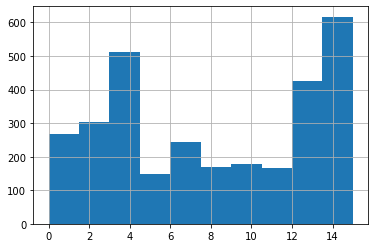

In [ ]:
clusters_fname = f"{dir_to_embed}_clusters.tsv"

# NOTE: when saving embeddings CSV, idx was a regular column (not a pandas 'index').
# When reloaded, 'idx' was made the index column. TODO: make original DF use 'idx' as index,
# so saving and reloading code is identical.
df.to_csv(clusters_fname, index=True, index_label="idx", sep="\t", header=True)

cdf = pd.read_csv(clusters_fname, delimiter="\t", index_col="idx")
cdf.knn_clusterid.hist()

In [ ]:
cdf.head()

,indiv_fname,orig_fname,label,knn_dist,knn_clusterid,knn_label,categorized_path
idx,,,,,,,
0,sb73p010-color.jpg,art/sb73p010-color.jpg,art,264.31735,5,1_watercolors,1_watercolors/sb73p010-color.jpg
1,sb77prear-cover.jpg,cover/sb77prear-cover.jpg,cover,273.05957,5,1_watercolors,1_watercolors/sb77prear-cover.jpg
2,sb55p003.jpg,art/sb55p003.jpg,art,141.10360,15,0_drawings,0_drawings/sb55p003.jpg
3,sb73p061.jpg,art/sb73p061.jpg,art,272.28570,12,2_notes,2_notes/sb73p061.jpg
4,sb73p041.jpg,art/sb73p041.jpg,art,151.18146,13,0_drawings,0_drawings/sb73p041.jpg


<Axes: >

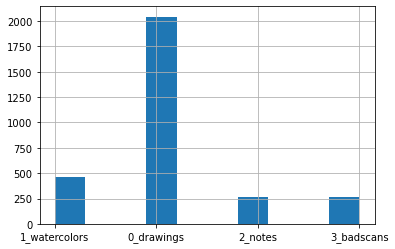

In [ ]:
cdf.knn_label.hist()

In [ ]:
categorize_files(cdf, epoch=EPOCH, prev_epoch=PREV_EPOCH)

already hand-labeled in 03_HANDLABELED (PREV epoch) - skipping sb73p010-color.jpg (to avoid duplicate work)
already hand-labeled in 03_HANDLABELED (PREV epoch) - skipping sb77prear-cover.jpg (to avoid duplicate work)
already hand-labeled in 03_HANDLABELED (PREV epoch) - skipping sb55p003.jpg (to avoid duplicate work)
already hand-labeled in 03_HANDLABELED (PREV epoch) - skipping sb73p061.jpg (to avoid duplicate work)
already hand-labeled in 03_HANDLABELED (PREV epoch) - skipping sb73p041.jpg (to avoid duplicate work)
already hand-labeled in 03_HANDLABELED (PREV epoch) - skipping sb55p008--diagchains.jpg (to avoid duplicate work)
already hand-labeled in 03_HANDLABELED (PREV epoch) - skipping sb38p028.jpg (to avoid duplicate work)
already hand-labeled in 03_HANDLABELED (PREV epoch) - skipping sb32p084.jpg (to avoid duplicate work)
already hand-labeled in 03_HANDLABELED (PREV epoch) - skipping sb07p083.jpg (to avoid duplicate work)
already hand-labeled in 03_HANDLABELED (PREV epoch) - ski

In [ ]:
# next step: merge hand-categorized files into 03_HANDLABELED to form a new epoch.

no env var SINGLELINE_DATA_HOME, defaulting to: None


In [ ]:
cdf

,indiv_fname,orig_fname,label,knn_dist,knn_clusterid,knn_label,categorized_path
idx,,,,,,,
0,sb73p010-color.jpg,art/sb73p010-color.jpg,art,264.31735,5,1_watercolors,1_watercolors/sb73p010-color.jpg
1,sb77prear-cover.jpg,cover/sb77prear-cover.jpg,cover,273.05957,5,1_watercolors,1_watercolors/sb77prear-cover.jpg
2,sb55p003.jpg,art/sb55p003.jpg,art,141.10360,15,0_drawings,0_drawings/sb55p003.jpg
3,sb73p061.jpg,art/sb73p061.jpg,art,272.28570,12,2_notes,2_notes/sb73p061.jpg
4,sb73p041.jpg,art/sb73p041.jpg,art,151.18146,13,0_drawings,0_drawings/sb73p041.jpg
...,...,...,...,...,...,...,...
1147,sb35p107.jpg,art/sb35p107.jpg,art,213.26338,7,1_watercolors,1_watercolors/sb35p107.jpg
1148,sb25p085.jpg,art/sb25p085.jpg,art,183.25726,13,0_drawings,0_drawings/sb25p085.jpg
1149,sb46p112.jpg,art/sb46p112.jpg,art,165.76804,3,0_drawings,0_drawings/sb46p112.jpg


In [ ]:
def merge_categorized_files(cdf, epoch, prev_epoch=None):
    categorized_dir = epoch.dir_02_CATEGORIZED()
    existing_categorized = {os.path.basename(f): str(f).replace(f"{categorized_dir}/", "") for f in get_image_files(categorized_dir)}
    
    prev_handlabeled_dir = prev_epoch.dir_03_HANDLABELED()
    prev_handlabeled = {os.path.basename(f): str(f).replace(f"{prev_handlabeled_dir}/", "") for f in get_image_files(prev_handlabeled_dir)} if prev_epoch else []

    prev_handlabeled_paths = []
    handlabeled_paths = []
    handlabel_different = []
    is_new = []
    
    for idx in range(len(cdf)):
        row = cdf.iloc[idx]   
        indiv_fname = row.indiv_fname

        prev_handlabeled_path = None
        handlabeled_path = None
        is_file_new_to_epoch = False
        
        if indiv_fname in existing_categorized:
            handlabeled_path = existing_categorized[indiv_fname]
            is_file_new_to_epoch = True
            # print(f"already copied to 02_CATEGORIZED (curr epoch) - skipping {indiv_fname}")
            # continue
        elif indiv_fname in prev_handlabeled:
            prev_handlabeled_path = prev_handlabeled[indiv_fname]
            handlabeled_path = prev_handlabeled_path
        else:
            raise Exception(f"file '{indiv_fname}' neither in previous epoch's 03_HANDLABELED dir nor current epoch's 02_CATEGORIZED dir")

        prev_handlabeled_paths.append(prev_handlabeled_path)
        handlabeled_paths.append(handlabeled_path)
        handlabel_different.append(handlabeled_path != row.categorized_path)
        is_new.append(is_file_new_to_epoch)

    cdf['handlabeled_path'] = handlabeled_paths
    cdf['is_handlabel_different_from_classifier'] = handlabel_different
    cdf['prev_handlabeled_path'] = prev_handlabeled_paths
    cdf['is_new'] = is_new
    

    for idx in range(len(cdf)):
        row = cdf.iloc[idx]   
        indiv_fname = row.indiv_fname
        
        orig_abs_path = epoch.dir_01_FLAT() / row.orig_fname
        if not os.path.isfile(orig_abs_path):
            raise Exception(f"expected original file to exist at: {orig_abs_path}")

        
        handlabeled_abs_path = epoch.dir_03_HANDLABELED() / row.handlabeled_path
        handlabeled_dir = os.path.dirname(handlabeled_abs_path)
        if not os.path.isdir(handlabeled_dir):
            os.makedirs(handlabeled_dir)
    
        print(f"writing to {handlabeled_abs_path}")
        shutil.copy(orig_abs_path, handlabeled_abs_path)
    return cdf

In [ ]:
cdf2 = merge_categorized_files(cdf, epoch=EPOCH, prev_epoch=PREV_EPOCH)

writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED/1_watercolors/sb73p010-color.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED/4_covers/sb77prear-cover.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED/0_drawings/sb55p003.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED/0_drawings/sb73p061.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED/0_drawings/sb73p041.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED/0_drawings/sb55p008--diagchains.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED/0_drawings/sb38p028.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoc

In [ ]:
cdf2.head()

,indiv_fname,orig_fname,label,knn_dist,knn_clusterid,knn_label,categorized_path,handlabeled_path,is_handlabel_different_from_classifier,prev_handlabeled_path,is_new
idx,,,,,,,,,,,
0,sb73p010-color.jpg,art/sb73p010-color.jpg,art,264.31735,5,1_watercolors,1_watercolors/sb73p010-color.jpg,1_watercolors/sb73p010-color.jpg,False,1_watercolors/sb73p010-color.jpg,False
1,sb77prear-cover.jpg,cover/sb77prear-cover.jpg,cover,273.05957,5,1_watercolors,1_watercolors/sb77prear-cover.jpg,4_covers/sb77prear-cover.jpg,True,4_covers/sb77prear-cover.jpg,False
2,sb55p003.jpg,art/sb55p003.jpg,art,141.10360,15,0_drawings,0_drawings/sb55p003.jpg,0_drawings/sb55p003.jpg,False,0_drawings/sb55p003.jpg,False
3,sb73p061.jpg,art/sb73p061.jpg,art,272.28570,12,2_notes,2_notes/sb73p061.jpg,0_drawings/sb73p061.jpg,True,0_drawings/sb73p061.jpg,False
4,sb73p041.jpg,art/sb73p041.jpg,art,151.18146,13,0_drawings,0_drawings/sb73p041.jpg,0_drawings/sb73p041.jpg,False,0_drawings/sb73p041.jpg,False


In [ ]:
cdf2[cdf2.is_new & cdf2.is_handlabel_different_from_classifier]

,indiv_fname,orig_fname,label,knn_dist,knn_clusterid,knn_label,categorized_path,handlabeled_path,is_handlabel_different_from_classifier,prev_handlabeled_path,is_new
idx,,,,,,,,,,,
198,sb50pcover.jpg,cover/sb50pcover.jpg,cover,640.35535,12,2_notes,2_notes/sb50pcover.jpg,4_covers/sb50pcover.jpg,True,None,True
1011,sb50p109-color-postit.jpg,notes/sb50p109-color-postit.jpg,notes,390.17325,5,1_watercolors,1_watercolors/sb50p109-color-postit.jpg,2_notes/sb50p109-color-postit.jpg,True,None,True
1137,sb50p089.jpg,art/sb50p089.jpg,art,138.40935,11,1_watercolors,1_watercolors/sb50p089.jpg,0_drawings/sb50p089.jpg,True,None,True
1881,sb50p093.jpg,art/sb50p093.jpg,art,256.20300,11,1_watercolors,1_watercolors/sb50p093.jpg,0_drawings/sb50p093.jpg,True,None,True
2307,sb50pcover-color.jpg,cover/sb50pcover-color.jpg,cover,379.17596,12,2_notes,2_notes/sb50pcover-color.jpg,4_covers/sb50pcover-color.jpg,True,None,True


In [ ]:
EPOCH.tsv_03_HANDLABELED()

Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED.tsv')

In [ ]:
handlabeled_fname = EPOCH.tsv_03_HANDLABELED()
print(handlabeled_fname)

# NOTE: when saving embeddings CSV, idx was a regular column (not a pandas 'index').
# When reloaded, 'idx' was made the index column. TODO: make original DF use 'idx' as index,
# so saving and reloading code is identical.
cdf2.to_csv(handlabeled_fname, index=True, index_label="idx", sep="\t", header=True)

hdf = pd.read_csv(handlabeled_fname, delimiter="\t", index_col="idx")

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED.tsv


In [ ]:
hdf.head()

,indiv_fname,orig_fname,label,knn_dist,knn_clusterid,knn_label,categorized_path,handlabeled_path,is_handlabel_different_from_classifier,prev_handlabeled_path,is_new
idx,,,,,,,,,,,
0,sb73p010-color.jpg,art/sb73p010-color.jpg,art,264.31735,5,1_watercolors,1_watercolors/sb73p010-color.jpg,1_watercolors/sb73p010-color.jpg,False,1_watercolors/sb73p010-color.jpg,False
1,sb77prear-cover.jpg,cover/sb77prear-cover.jpg,cover,273.05957,5,1_watercolors,1_watercolors/sb77prear-cover.jpg,4_covers/sb77prear-cover.jpg,True,4_covers/sb77prear-cover.jpg,False
2,sb55p003.jpg,art/sb55p003.jpg,art,141.10360,15,0_drawings,0_drawings/sb55p003.jpg,0_drawings/sb55p003.jpg,False,0_drawings/sb55p003.jpg,False
3,sb73p061.jpg,art/sb73p061.jpg,art,272.28570,12,2_notes,2_notes/sb73p061.jpg,0_drawings/sb73p061.jpg,True,0_drawings/sb73p061.jpg,False
4,sb73p041.jpg,art/sb73p041.jpg,art,151.18146,13,0_drawings,0_drawings/sb73p041.jpg,0_drawings/sb73p041.jpg,False,0_drawings/sb73p041.jpg,False


## processing

### v0: dummy crop (both sides, by a fixed percentage)

In [ ]:
CURR_03_HAND

Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED')

In [ ]:
CURR_04_CROP

Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP')

In [ ]:

input_dir = CURR_03_HAND
output_dir = CURR_04_CROP
df = hdf

# preprocessing_dir = (
#     singleline_data_home() / "raster/epoch-20231214/10_SIMPLE_CROP"
# )  # <-- this was defined earlier.
existing_files = L(os.path.basename(f) for f in get_image_files(output_dir))

crop_frac = 20.0 / 224
print(f"using crop_frac={crop_frac}")

for idx in range(len(df)):
    row = df.iloc[idx]
    indiv_fname = row.indiv_fname
    if indiv_fname in existing_files:
        print(f"skipping {indiv_fname}")
        continue

    handlabeled_abs_path = input_dir / row.handlabeled_path
    if not os.path.isfile(handlabeled_abs_path):
        raise Exception(f"input file doesnt exist: {handlabeled_abs_path}")

    crop_abs_path = output_dir / row.handlabeled_path
    crop_dir = os.path.dirname(crop_abs_path)
    if not os.path.isdir(crop_dir):
        os.makedirs(crop_dir)
    
    print(f"writing from {handlabeled_abs_path} to {crop_abs_path}")

    # TODO: check aspect ratio of image and decide which direction to crop,
    # to account for binder rings in landscape orientation (for pages that
    # have been rotated).
    try:
        img = Image.open(handlabeled_abs_path)
        print(img.size)
        crop_amt = math.floor(
            img.size[0] * crop_frac
        )  # compute number of pixels to crop (roughly 8% of page size)
        cropped_img = img.crop((crop_amt, 0, img.size[0] - crop_amt, img.size[1]))
        # cropped_img
        cropped_img.save(crop_abs_path)
    except Exception as e:
        print(e)

using crop_frac=0.08928571428571429
writing from /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED/1_watercolors/sb73p010-color.jpg to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/1_watercolors/sb73p010-color.jpg
(1660, 2469)
writing from /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED/4_covers/sb77prear-cover.jpg to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/4_covers/sb77prear-cover.jpg
(1980, 2515)
writing from /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED/0_drawings/sb55p003.jpg to /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p003.jpg
(1931, 2455)
writing from /Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/03_HANDLABELED/0_drawings/sb73p061.jpg to /Users/al/Dropbox/2-Areas/2-Sketchb

### vectorize

In [ ]:
TARGET_DIR=CURR_04_CROP/'0_drawings'

In [ ]:
%%bash -s "$TARGET_DIR"

TARGET_DIR=$1
CENTERLINE_TRACE_DIR="/Users/al/code/_svg/inkscape-centerline-trace"

for file in $(ls $TARGET_DIR); do
    export idx=$(basename $file .jpg)
    export inpath=$TARGET_DIR/$file
    export outpath=$TARGET_DIR/$idx.svg
    if ! [ -f $outpath ]; then
        echo "$outpath does not exist."
        $CENTERLINE_TRACE_DIR/centerline-trace.sh $inpath > $outpath
    else
        echo "$outpath exists; skipping."
    fi
done

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p021--all-wound-up.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p040--look-eyes.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p042--look-squares.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p048--uplift.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p054--upward-squiggle.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p062--covid-bleach.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p068--mi6-mom.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p088--attention.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p090--bated-breath.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p102--low-five.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p121.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p122.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p124.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p126--crosshatch-lips.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p128--hierarchy.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p130--stamp.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p130.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p132.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p134.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p138.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p141--heiro-one-col.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p143--heiro-four-cols.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p145--heiro-five-cols.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p147--heiro-six-cols.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p149--heiro.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb00p151--heiro-seven-cols.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p019-b.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p051-color.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p052-color.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p064-color.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb05p121.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb07p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb07p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb07p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb07p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb07p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb07p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb07p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb07p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb07p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb11p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p121.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p122.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p123.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p124.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p125.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p126.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p127.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p129.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p133.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p135.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p137.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p139.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p141.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p143.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p145.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p150.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p151.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p153.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p154.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p155.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p156.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p157.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p158.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p159.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p160.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p161.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p162.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p163.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p169.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p171.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p172.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p173.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p174.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p175.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p176.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p177.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p179-whats-in-a-sketchbook.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p183.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p185.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p187.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p189.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p191.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p193.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p195.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p197.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p199.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p205.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p209.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p215.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p217.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p219.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p220.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p221.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p226.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p227.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p239.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p241.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p243.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p245.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p247.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p249.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb25p251.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p000.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p029--did-i-shower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p061--negative-space.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p062--bird-watching.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p063--cherchez.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p064--yoga.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb26p065--dispute.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p016--2021-04-25.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p022--2021-05-03.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p044--diag-quarter.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/copy.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p092.svg exists; skipping.
/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb28p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p001--side-eye.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p003--peach-top.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p005--dino-defender.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p007--jelly-commander.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p008--karma-yoga.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p011--jeff-tezos.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p014-stamp.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p015-stamp.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p052--hands-practice.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p053--hands-timecheck.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p058--body-sizes.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p067-light.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p087--parents.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p089--trader-joes.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p095--dayumm.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p098--maybe.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb31p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb32p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p056--the-point.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p058--hairswoosh.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p065--eyes-and-noses.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p070--downbeat-disco.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p073--tinybodies.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p077--posturing.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p092--antenna.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p095--selfpoint.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p096--radhaus-friday.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p097--pair-phone.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p098--barstool.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p110--look.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p116--negative-hug.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p117--robo-spring.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb35p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p007--please-dont.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p053--gown.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p062--microcosm.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p066--artdeco.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p067--wince.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p068--slash0.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p069--slash1.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p070--slash2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p071--slash3.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p072--daemon.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p073--gown2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p074--crosslegged.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p078--donkeys1.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p079--donkeys2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p080--donkeys3.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p082--diag1.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p089--gown3.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p094--aboutme.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p096--bundled.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p098--eyesclosed-rounded.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p104--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p105--minfig.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p006--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p016--cafedoggy.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p021--cafedoggy2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p026--manifesting.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p039--square.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p040--radiate.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p041--de-platformed.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p045--supermin.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p054--spiral.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p055--wintercoats.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p059--high-alert.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p060--tadaa.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb42p121.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p077--full-diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p083--sneer.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p085--littlehat.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p118v2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb44p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p003--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p020--onfire.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p038--point2point.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p050--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p054--diag2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p066--min1.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p067--min2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p073--min3.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p086--min4.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p089--winnie1.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p090--winnie2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p091--winnie3.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p092--winnie4.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p093--winnie5.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p094--winnie6.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p095--winnie7.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p096--winnie8.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p097--min5.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p119--toomin.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p121.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb45p122.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p006.ec.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p007.ec.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p021.ec.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p041--fuzzy.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p043-light.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p045-light.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p047-light.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p049-light.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p055-light.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p094-nonOverlap.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p096-angular.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p097-attitude.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb46p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb48p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p095--connect-four.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p119--frames.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb50p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p008--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p011--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p012--animal-party.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p013--animal-party-2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p017--sparsechains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p032--diagchains-with-circles.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p039--tiny-characters.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p040--tiny-characters.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p042--diagchains-large.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p046--couch.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p048--minimalface-and-skatecat.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p051--winnie-and-dog.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p063--animal-party-3.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p077--nolips.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p086--bun.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p092--detach.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p093--speechless.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p094--furrowed.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p095--blankeyedstare.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p097--faceoff.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p101--faceoff2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p001a.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p003a.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p006--kitchen-nap.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p007--greenpoint-nap.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p008--playa-nap.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p010--gan-dream.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p032--linechains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p034--berlin-speakers.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p035--speakintothemic.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p037--belin-speakers-2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p089--gerry.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p090--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb67p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p021-needsomespace.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p042--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p043--lady-rouge.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p044--ceramic-bunny-ears.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p047--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p106--the-shot.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p120-color.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb68p122.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p005--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p042--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p046--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p048--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p069--wine.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p070--coffee.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p085--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p088--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p089--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p094--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p098--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p107--coffee.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb69p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p003--wine.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p004--coffee.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p005--coffee.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p006--coffee.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p007--wine.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p008--wine.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p009--coffee.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p010--wine.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p011--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p012--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb72p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p020--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p021--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p021a--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p021a.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p022b.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p040--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p042-alt.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p058--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p064--croissant.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p065--business-lion.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p066--merchants.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb77p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p026--dog.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p074--dogs.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb78p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

In [ ]:
!ls {TARGET_DIR}/*.svg | wc -l

    2017


## stroke3

In [ ]:
import os

import numpy as np
import pandas as pd

from singleline_stroke3.display import *
from singleline_stroke3.strokes import *
from singleline_stroke3.svg import *
from singleline_stroke3.transforms import *

In [ ]:
TARGET_DIR

Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings')

In [ ]:
def enumerate_svgs(input_dir):
    """Find all the files within a directory (non-recursively)"""
    files = []
    for file in os.listdir(input_dir):
        if os.path.isfile(os.path.join(input_dir, file)) and os.path.splitext(file)[1] == '.svg':
            files.append(file)
    return files

In [ ]:
hdf.head()

,indiv_fname,orig_fname,label,knn_dist,knn_clusterid,knn_label,categorized_path,handlabeled_path,is_handlabel_different_from_classifier,prev_handlabeled_path,is_new
idx,,,,,,,,,,,
0,sb73p010-color.jpg,art/sb73p010-color.jpg,art,264.31735,5,1_watercolors,1_watercolors/sb73p010-color.jpg,1_watercolors/sb73p010-color.jpg,False,1_watercolors/sb73p010-color.jpg,False
1,sb77prear-cover.jpg,cover/sb77prear-cover.jpg,cover,273.05957,5,1_watercolors,1_watercolors/sb77prear-cover.jpg,4_covers/sb77prear-cover.jpg,True,4_covers/sb77prear-cover.jpg,False
2,sb55p003.jpg,art/sb55p003.jpg,art,141.10360,15,0_drawings,0_drawings/sb55p003.jpg,0_drawings/sb55p003.jpg,False,0_drawings/sb55p003.jpg,False
3,sb73p061.jpg,art/sb73p061.jpg,art,272.28570,12,2_notes,2_notes/sb73p061.jpg,0_drawings/sb73p061.jpg,True,0_drawings/sb73p061.jpg,False
4,sb73p041.jpg,art/sb73p041.jpg,art,151.18146,13,0_drawings,0_drawings/sb73p041.jpg,0_drawings/sb73p041.jpg,False,0_drawings/sb73p041.jpg,False


In [ ]:
hdf['handlabeled_category'] = hdf.handlabeled_path.map(lambda s: os.path.dirname(s))

In [ ]:
svg_df = hdf.copy()
svg_df['svg_autotrace_path'] = svg_df.handlabeled_path.map(lambda s: s.replace('.jpg', '.svg'))

In [ ]:
svg_df.head()

,indiv_fname,orig_fname,label,knn_dist,knn_clusterid,knn_label,categorized_path,handlabeled_path,is_handlabel_different_from_classifier,prev_handlabeled_path,is_new,svg_autotrace_path,handlabeled_category
idx,,,,,,,,,,,,,
0,sb73p010-color.jpg,art/sb73p010-color.jpg,art,264.31735,5,1_watercolors,1_watercolors/sb73p010-color.jpg,1_watercolors/sb73p010-color.jpg,False,1_watercolors/sb73p010-color.jpg,False,1_watercolors/sb73p010-color.svg,1_watercolors
1,sb77prear-cover.jpg,cover/sb77prear-cover.jpg,cover,273.05957,5,1_watercolors,1_watercolors/sb77prear-cover.jpg,4_covers/sb77prear-cover.jpg,True,4_covers/sb77prear-cover.jpg,False,4_covers/sb77prear-cover.svg,4_covers
2,sb55p003.jpg,art/sb55p003.jpg,art,141.10360,15,0_drawings,0_drawings/sb55p003.jpg,0_drawings/sb55p003.jpg,False,0_drawings/sb55p003.jpg,False,0_drawings/sb55p003.svg,0_drawings
3,sb73p061.jpg,art/sb73p061.jpg,art,272.28570,12,2_notes,2_notes/sb73p061.jpg,0_drawings/sb73p061.jpg,True,0_drawings/sb73p061.jpg,False,0_drawings/sb73p061.svg,0_drawings
4,sb73p041.jpg,art/sb73p041.jpg,art,151.18146,13,0_drawings,0_drawings/sb73p041.jpg,0_drawings/sb73p041.jpg,False,0_drawings/sb73p041.jpg,False,0_drawings/sb73p041.svg,0_drawings


In [ ]:
DEL_COLS = [
    'knn_dist',
    'knn_clusterid',
    'knn_label',
    'categorized_path',
    'is_handlabel_different_from_classifier',
    'prev_handlabeled_path',
]
for c in DEL_COLS:
    if c in svg_df.columns:
        del svg_df[c]

In [ ]:
svg_df.columns

Index(['indiv_fname', 'orig_fname', 'label', 'handlabeled_path', 'is_new',
       'svg_autotrace_path', 'handlabeled_category'],
      dtype='object')

In [ ]:
svg_df.head()

,indiv_fname,orig_fname,label,handlabeled_path,is_new,svg_autotrace_path,handlabeled_category
idx,,,,,,,
0,sb73p010-color.jpg,art/sb73p010-color.jpg,art,1_watercolors/sb73p010-color.jpg,False,1_watercolors/sb73p010-color.svg,1_watercolors
1,sb77prear-cover.jpg,cover/sb77prear-cover.jpg,cover,4_covers/sb77prear-cover.jpg,False,4_covers/sb77prear-cover.svg,4_covers
2,sb55p003.jpg,art/sb55p003.jpg,art,0_drawings/sb55p003.jpg,False,0_drawings/sb55p003.svg,0_drawings
3,sb73p061.jpg,art/sb73p061.jpg,art,0_drawings/sb73p061.jpg,False,0_drawings/sb73p061.svg,0_drawings
4,sb73p041.jpg,art/sb73p041.jpg,art,0_drawings/sb73p041.jpg,False,0_drawings/sb73p041.svg,0_drawings


In [ ]:
# filter to drawings only
svg_df = svg_df[svg_df.handlabeled_category == '0_drawings']

In [ ]:
svg_df.head()

,indiv_fname,orig_fname,label,handlabeled_path,is_new,svg_autotrace_path,handlabeled_category
idx,,,,,,,
2,sb55p003.jpg,art/sb55p003.jpg,art,0_drawings/sb55p003.jpg,False,0_drawings/sb55p003.svg,0_drawings
3,sb73p061.jpg,art/sb73p061.jpg,art,0_drawings/sb73p061.jpg,False,0_drawings/sb73p061.svg,0_drawings
4,sb73p041.jpg,art/sb73p041.jpg,art,0_drawings/sb73p041.jpg,False,0_drawings/sb73p041.svg,0_drawings
5,sb55p008--diagchains.jpg,art/sb55p008--diagchains.jpg,art,0_drawings/sb55p008--diagchains.jpg,False,0_drawings/sb55p008--diagchains.svg,0_drawings
6,sb38p028.jpg,art/sb38p028.jpg,art,0_drawings/sb38p028.jpg,False,0_drawings/sb38p028.svg,0_drawings


In [ ]:
# important: reset index column so it lines up to dataframe
svg_df = svg_df.reset_index()

In [ ]:
if 'idx' in svg_df.columns:
    del svg_df['idx']
svg_df.head()

,indiv_fname,orig_fname,label,handlabeled_path,is_new,svg_autotrace_path,handlabeled_category
0,sb55p003.jpg,art/sb55p003.jpg,art,0_drawings/sb55p003.jpg,False,0_drawings/sb55p003.svg,0_drawings
1,sb73p061.jpg,art/sb73p061.jpg,art,0_drawings/sb73p061.jpg,False,0_drawings/sb73p061.svg,0_drawings
2,sb73p041.jpg,art/sb73p041.jpg,art,0_drawings/sb73p041.jpg,False,0_drawings/sb73p041.svg,0_drawings
3,sb55p008--diagchains.jpg,art/sb55p008--diagchains.jpg,art,0_drawings/sb55p008--diagchains.jpg,False,0_drawings/sb55p008--diagchains.svg,0_drawings
4,sb38p028.jpg,art/sb38p028.jpg,art,0_drawings/sb38p028.jpg,False,0_drawings/sb38p028.svg,0_drawings


In [ ]:
svg_autotrace_fname = EPOCH.tsv_04_CROP()
print(svg_autotrace_fname)

# NOTE: when saving embeddings CSV, idx was a regular column (not a pandas 'index').
# When reloaded, 'idx' was made the index column. TODO: make original DF use 'idx' as index,
# so saving and reloading code is identical.
svg_df.to_csv(svg_autotrace_fname, index=True, index_label="idx", sep="\t", header=True)

svg_df = pd.read_csv(svg_autotrace_fname, delimiter="\t", index_col="idx")
svg_df.head()

/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP.tsv


,indiv_fname,orig_fname,label,handlabeled_path,is_new,svg_autotrace_path,handlabeled_category
idx,,,,,,,
0,sb55p003.jpg,art/sb55p003.jpg,art,0_drawings/sb55p003.jpg,False,0_drawings/sb55p003.svg,0_drawings
1,sb73p061.jpg,art/sb73p061.jpg,art,0_drawings/sb73p061.jpg,False,0_drawings/sb73p061.svg,0_drawings
2,sb73p041.jpg,art/sb73p041.jpg,art,0_drawings/sb73p041.jpg,False,0_drawings/sb73p041.svg,0_drawings
3,sb55p008--diagchains.jpg,art/sb55p008--diagchains.jpg,art,0_drawings/sb55p008--diagchains.jpg,False,0_drawings/sb55p008--diagchains.svg,0_drawings
4,sb38p028.jpg,art/sb38p028.jpg,art,0_drawings/sb38p028.jpg,False,0_drawings/sb38p028.svg,0_drawings


In [ ]:
len(svg_df)

2017

In [ ]:
svg_df

,indiv_fname,orig_fname,label,handlabeled_path,is_new,svg_autotrace_path,handlabeled_category
idx,,,,,,,
0,sb55p003.jpg,art/sb55p003.jpg,art,0_drawings/sb55p003.jpg,False,0_drawings/sb55p003.svg,0_drawings
1,sb73p061.jpg,art/sb73p061.jpg,art,0_drawings/sb73p061.jpg,False,0_drawings/sb73p061.svg,0_drawings
2,sb73p041.jpg,art/sb73p041.jpg,art,0_drawings/sb73p041.jpg,False,0_drawings/sb73p041.svg,0_drawings
3,sb55p008--diagchains.jpg,art/sb55p008--diagchains.jpg,art,0_drawings/sb55p008--diagchains.jpg,False,0_drawings/sb55p008--diagchains.svg,0_drawings
4,sb38p028.jpg,art/sb38p028.jpg,art,0_drawings/sb38p028.jpg,False,0_drawings/sb38p028.svg,0_drawings
...,...,...,...,...,...,...,...
2012,sb69p098--diagchains.jpg,art/sb69p098--diagchains.jpg,art,0_drawings/sb69p098--diagchains.jpg,False,0_drawings/sb69p098--diagchains.svg,0_drawings
2013,sb25p085.jpg,art/sb25p085.jpg,art,0_drawings/sb25p085.jpg,False,0_drawings/sb25p085.svg,0_drawings
2014,sb46p112.jpg,art/sb46p112.jpg,art,0_drawings/sb46p112.jpg,False,0_drawings/sb46p112.svg,0_drawings


In [ ]:
def svgs_to_deltas(
    input_df,
    input_dir,
    stroke3_dir=None,
    target_size=200,
    total_n=1000,
    min_n=3,
    # epsilon=1.0,
    limit=None,
):
    if not os.path.isdir(stroke3_dir):
        os.makedirs(stroke3_dir)

    dataset = []
    metadata = []
    for idx in range(len(input_df)):
        if limit and idx >= limit:
            break
        row = input_df.iloc[idx]
        fname = row.svg_autotrace_path
        input_abs_path = os.path.join(input_dir, fname)

        print(input_abs_path)

        had_error = False
        err_msg = ""
        try:
            rescaled_strokes = svg_to_strokes(input_abs_path, total_n=total_n, min_n=min_n)
            num_raw_points = np.vstack(rescaled_strokes).shape[0]
            
            joined_strokes, _ = merge_until(rescaled_strokes, dist_threshold=15.0)
            spliced_strokes, _ = splice_until(joined_strokes, dist_threshold=40.0)

            print(
                f"{fname}: {len(rescaled_strokes)} strokes -> {len(joined_strokes)} joined -> {len(spliced_strokes)} spliced"
            )

            deltas = strokes_to_deltas(spliced_strokes) #stroke_rdp_deltas(spliced_strokes, epsilon=epsilon)
            
            # rdp_points = deltas.shape[0]
            
            #deltas = stroke_rdp_deltas(spliced_strokes, epsilon=epsilon)
            ## monitor number of points before/after applying RDP path simplification algorithm
            # raw_points = np.vstack(rescaled_strokes).shape[0]  
            #print(f"{input_fname} points: raw={raw_points}, rdp={rdp_points}")

            if stroke3_dir:
                def new_suffix(dir, fname, suffix):
                    sd = dir
                    if not os.path.isdir(sd):
                        os.makedirs(sd)
                    fullpath = os.path.join(sd, fname.replace(".svg", suffix))
                    if not os.path.isdir(os.path.dirname(fullpath)):
                        os.makedirs(os.path.dirname(fullpath))
                    return fullpath

                final_n_strokes = len(spliced_strokes)
                dir = stroke3_dir
                # dir = f"png/{final_n_strokes:02d}"
                
                # plot_strokes(
                #     rescaled_strokes, fname=new_suffix(dir, fname, ".0_strokes.png")
                # )
                # plot_strokes(
                #     joined_strokes, fname=new_suffix(dir, fname, ".1_joined.png")
                # )
                # plot_strokes(
                #     spliced_strokes, fname=new_suffix(dir, fname, ".2_spliced.png")
                # )
                # plot_strokes(
                #     deltas_to_strokes(deltas),
                #     fname=new_suffix(dir, fname, ".3_deltas.png"),
                # )

                # raw_output_fname = new_suffix('svg', fname, ".raw.svg")
                # with open(raw_output_fname, "w", encoding="utf-8") as raw_out:
                #     raw_dwg = render_strokes(rescaled_strokes, target_size=target_size)
                #     raw_dwg.write(raw_out, pretty=True)
                #     print(f"\twrote {raw_output_fname}")

                # preproc_output_fname = new_suffix('svg', fname, ".preproc.svg")
                # with open(preproc_output_fname, "w", encoding="utf-8") as preproc_out:
                #     preproc_dwg = render_deltas(deltas, target_size=target_size)
                #     preproc_dwg.save(preproc_output_fname)
                #     print(f"\twrote {preproc_output_fname}")     
            dataset.append(deltas)
            metadata.append({
                'idx': idx,
                **(row.to_dict()),
                'total_strokes': len(rescaled_strokes),
                'joined_strokes': len(joined_strokes), 
                'spliced_strokes': len(spliced_strokes),
                'total_points': num_raw_points,
                'had_error': had_error,
                'err_msg': err_msg,
            })
        except Exception as e:
            had_error = True
            err_msg = e
            print(f"error processing idx={idx} input_fname={input_abs_path}: {e}")
            # raise e
    return dataset, metadata

In [ ]:
# SVG paths are relative to this dir, e.g. '0_drawings/sb45p076.svg'
SVG_INPUT_DIR = EPOCH.dir_04_CROP() 

STROKE3_OUTPUT_DIR = EPOCH.dir_05_STROKE3()
STROKE3_TSV_FNAME = EPOCH.tsv_05_STROKE3()
STROKE3_NPZ_FNAME = str(STROKE3_TSV_FNAME).replace('.tsv', '.npz')
BBOXSEP_OUTPUT_DIR = EPOCH.dir_06_BBOXSEP()
BBOXSEP_TSV_FNAME = EPOCH.tsv_06_BBOXSEP()

dataset, metadata = svgs_to_deltas(
    input_df=svg_df,
    input_dir=SVG_INPUT_DIR,
    stroke3_dir=STROKE3_OUTPUT_DIR,
    target_size=200,
    total_n=1000,
    min_n=3,
    # limit=5,
)

stroke3_ds = np.array(dataset, dtype=object)
np.savez(STROKE3_NPZ_FNAME, stroke3_ds, encoding='latin1', allow_pickle=True)

# stroke3_df = input_df.copy()
# if limit:
#     stroke3_df = stroke3_df.iloc[:limit+1]

# meta_cols = [
#     'total_points',
#     'had_error',
#     'err_msg',    
#     'total_strokes',
#     'joined_strokes',
#     'spliced_strokes',
# ]
# for c in meta_cols:
#     stroke3_df[c] = [m[c] for m in metadata]

stroke3_df = pd.DataFrame(metadata)



stroke3_df.to_csv(STROKE3_TSV_FNAME, index=True, index_label="idx", sep="\t", header=True)
stroke3_df = pd.read_csv(STROKE3_TSV_FNAME, delimiter="\t", index_col="idx")
stroke3_df.head()



/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p003.svg
0_drawings/sb55p003.svg: 61 strokes -> 10 joined -> 3 spliced
/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p061.svg
0_drawings/sb73p061.svg: 72 strokes -> 15 joined -> 7 spliced
/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb73p041.svg
0_drawings/sb73p041.svg: 78 strokes -> 15 joined -> 4 spliced
/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p008--diagchains.svg
0_drawings/sb55p008--diagchains.svg: 77 strokes -> 17 joined -> 8 spliced
/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb38p028.svg
0_drawings/sb38p028.svg: 44 strokes -> 4 joined -> 4 spliced
/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data/raster/epoch-20240104/04_CROP/0_drawings/sb55p080.svg
0_drawi

,idx.1,indiv_fname,orig_fname,label,handlabeled_path,is_new,svg_autotrace_path,handlabeled_category,total_strokes,joined_strokes,spliced_strokes,total_points,had_error,err_msg
idx,,,,,,,,,,,,,,
0,0,sb55p003.jpg,art/sb55p003.jpg,art,0_drawings/sb55p003.jpg,False,0_drawings/sb55p003.svg,0_drawings,61,10,3,932,False,NaN
1,1,sb73p061.jpg,art/sb73p061.jpg,art,0_drawings/sb73p061.jpg,False,0_drawings/sb73p061.svg,0_drawings,72,15,7,719,False,NaN
2,2,sb73p041.jpg,art/sb73p041.jpg,art,0_drawings/sb73p041.jpg,False,0_drawings/sb73p041.svg,0_drawings,78,15,4,907,False,NaN
3,3,sb55p008--diagchains.jpg,art/sb55p008--diagchains.jpg,art,0_drawings/sb55p008--diagchains.jpg,False,0_drawings/sb55p008--diagchains.svg,0_drawings,77,17,8,875,False,NaN
4,4,sb38p028.jpg,art/sb38p028.jpg,art,0_drawings/sb38p028.jpg,False,0_drawings/sb38p028.svg,0_drawings,44,4,4,951,False,NaN


In [ ]:
if 'idx.1' in stroke3_df.columns:
    del stroke3_df['idx.1']
stroke3_df.head()

,indiv_fname,orig_fname,label,handlabeled_path,is_new,svg_autotrace_path,handlabeled_category,total_strokes,joined_strokes,spliced_strokes,total_points,had_error,err_msg
idx,,,,,,,,,,,,,
0,sb55p003.jpg,art/sb55p003.jpg,art,0_drawings/sb55p003.jpg,False,0_drawings/sb55p003.svg,0_drawings,61,10,3,932,False,NaN
1,sb73p061.jpg,art/sb73p061.jpg,art,0_drawings/sb73p061.jpg,False,0_drawings/sb73p061.svg,0_drawings,72,15,7,719,False,NaN
2,sb73p041.jpg,art/sb73p041.jpg,art,0_drawings/sb73p041.jpg,False,0_drawings/sb73p041.svg,0_drawings,78,15,4,907,False,NaN
3,sb55p008--diagchains.jpg,art/sb55p008--diagchains.jpg,art,0_drawings/sb55p008--diagchains.jpg,False,0_drawings/sb55p008--diagchains.svg,0_drawings,77,17,8,875,False,NaN
4,sb38p028.jpg,art/sb38p028.jpg,art,0_drawings/sb38p028.jpg,False,0_drawings/sb38p028.svg,0_drawings,44,4,4,951,False,NaN


### bounding box separation

In [ ]:
from singleline_stroke3.bounding_boxes import *

In [ ]:
BBOXSEP_OUTPUT_DIR = EPOCH.dir_06_BBOXSEP()
BBOXSEP_TSV_FNAME = EPOCH.tsv_06_BBOXSEP()
BBOXSEP_NPZ_FNAME = str(BBOXSEP_TSV_FNAME).replace('.tsv', '.npz')

In [ ]:
stroke3_dataset = np.load(
    STROKE3_NPZ_FNAME,
    encoding="latin1",
    allow_pickle=True,
)["arr_0"]

In [ ]:
len(stroke3_dataset)

2015

In [ ]:
def sep_stroke3_with_bounding_boxes(
    input_df,
    input_arr,
    bboxsep_dir=None,
    # target_size=200,
    limit=None,
    # # TODO: apply uniform RDP? or repeatedly till under max_seq_len?
    # epsilon=1.0,
    # max_seq_len=250,
):
    if not os.path.isdir(bboxsep_dir):
        os.makedirs(bboxsep_dir)

    new_idx = 0
    dataset = []
    metadata = []
    for idx in range(len(input_df)):
        if limit and idx >= limit:
            break
        row = input_df.iloc[idx]
        fname = row.svg_autotrace_path
        expected_num_points = row.total_points
        expected_num_strokes = row.spliced_strokes

        had_error = False
        err_msg = ""
        try:
            strokes = deltas_to_strokes(input_arr[idx])
            assert expected_num_strokes == len(strokes), f"{idx} num points mismatch: expected {expected_num_points}, actual {num_raw_points}"
            num_raw_points = np.vstack(strokes).shape[0]
            assert expected_num_points == num_raw_points, f"{idx} num points mismatch: expected {expected_num_points}, actual {num_raw_points}"

            for j, s in enumerate(group_and_rescale_overlapping_strokes(strokes)):
                group_id = j
                output_png_fname = f"{os.path.splitext(fname)[0]}g{group_id:02d}.png"
                
                output_png_abs_path = os.path.join(bboxsep_dir, output_png_fname)
                if not os.path.isdir(os.path.dirname(output_png_abs_path)):
                    os.makedirs(os.path.dirname(output_png_abs_path))
                
                plot_strokes(s, fname=output_png_abs_path, transparent=True)
                
                dataset.append(s)
                metadata.append({
                    'new_idx': new_idx,
                    'group_fname': output_png_fname,
                    'group_id': group_id,
                    'group_num_strokes': len(s),
                    'group_num_points': np.vstack(s).shape[0],
                    **row.to_dict(),
                })
                
                new_idx += 1
        except Exception as e:
            had_error = True
            err_msg = e
            print(f"error processing idx={idx} input_fname={fname}: {e}")
            # raise e
    return dataset, metadata   
                
            
    # output_items = []
    # for i in range(len(full_dataset)):
    #     item = deltas_to_strokes(full_dataset[i])
        
    #         plot_strokes(s, fname=debug_dir / f"{i:04d}_group-{j:02d}.png")
    #         plot_strokes(
    #             s, fname=final_dir / f"{i:04d}_group-{j:02d}.png", transparent=True
    #         )
    #         output_items.append(s)
    #     # show the original for comparison
    #     plot_strokes(item, bounding_boxes=True, fname=debug_dir / f"{i:04d}__overview.png")
    
    # new_dataset = np.array(output_items, dtype=object)
    # new_dataset_deltas = np.array([strokes_to_deltas(s) for s in new_dataset], dtype=object)
    
    # np.savez(npz_dir / "all.npz", new_dataset_deltas, encoding="latin1", allow_pickle=True)



In [ ]:
dataset, metadata = sep_stroke3_with_bounding_boxes(
    input_df=stroke3_df,
    input_arr=stroke3_dataset,
    bboxsep_dir=BBOXSEP_OUTPUT_DIR,
    # limit=5
)

bboxsep_ds = np.array(dataset, dtype=object)
np.savez(BBOXSEP_NPZ_FNAME, bboxsep_ds, encoding='latin1', allow_pickle=True)

bboxsep_df = pd.DataFrame(metadata)
bboxsep_df.to_csv(BBOXSEP_TSV_FNAME, index=True, index_label="idx", sep="\t", header=True)
bboxsep_df = pd.read_csv(BBOXSEP_TSV_FNAME, delimiter="\t", index_col="idx")
bboxsep_df.head()


### scratch

In [ ]:
### get embeddings for the cropped images

In [ ]:
# cropped_emb_rows = []
# for x in embed_dir(
#     preprocessing_dir, learn
# ):  # important: use "preprocessing_dir" so we get embeds of the cropped imgs
#     cropped_emb_rows.append(x)
# cropped_embd_df = pd.DataFrame(cropped_emb_rows)
# print(f"num rows: {len(cropped_embd_df)}")
# cropped_embd_df.head()

join the dataframes.

from [pandas.DataFrame.join — pandas 2.1.4 documentation](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.join.html):

> Another option to join using the key columns is to use the on parameter. DataFrame.join always uses other’s index but we can use any column in df. This method preserves the original DataFrame’s index in the result.
> Note: default is a "left" join, preserving the left's index space.

`rsuffix` to add `_cropped` to any overlapping column names.

Here are the expected columns:
```
idx        # totally different from index scheme already being used - kill it
abs_fname  # should be same as preprocessed_abs_path
rel_fname  # same as humanlabeled_rel_path (JOIN KEY)
label      # same as humanlabeled_metacluster_name
pred_label # DROP
pred_idx   # DROP
pred_probs # DROP
emb_csv    # keep this!
```


In [ ]:
# del cropped_embd_df["idx"]
# del cropped_embd_df["pred_label"]
# del cropped_embd_df["pred_probs"]
# del cropped_embd_df["pred_idx"]
# cropped_embd_df.head()

In [ ]:
# joined_df = metaclusters_df.join(
#     cropped_embd_df.set_index("rel_fname"),
#     on="handlabeled_rel_path",
#     # validate='one_to_one',
#     rsuffix="_cropped",
# )
# joined_df.head()

In [ ]:
# # validation
# assert len(metaclusters_df) == len(joined_df), "some rows are missing"

In [ ]:
# assert not joined_df.apply(
#     lambda row: row.abs_fname_cropped == row.preprocessed_abs_path, axis=1
# ).any(), "some row had a mismatch between expected filenames"
# del joined_df["abs_fname_cropped"]

In [ ]:
# assert not joined_df.apply(
#     lambda row: row.label_cropped == row.handlabeled_metacluster_name, axis=1
# ).any(), "some row had a mismatch between expected metacluster_name"
# # del joined_df["label_cropped"]

In [ ]:
# joined_df[["label_cropped", "handlabeled_metacluster_name"]].head()

In [ ]:
# joined_df["labels_match"] = joined_df.apply(
#     lambda row: row.label_cropped == row.handlabeled_metacluster_name, axis=1
# )

In [ ]:
# joined_df[joined_df.labels_match == False]

In [ ]:
# del joined_df['labels_match']

In [ ]:
# del joined_df['label_cropped']

In [ ]:
# cropped_tsv_fname = f"{preprocessing_dir}/cropped.tsv"

# joined_df.to_csv(
#     cropped_tsv_fname, index=True, index_label="idx", sep="\t", header=True
# )

# cropped_df = pd.read_csv(cropped_tsv_fname, delimiter="\t", index_col="idx")

# cdf = cropped_df
# cdf.head()